In this Project, we will look at the largest open source multi-city detector loop dataset (https://utd19.ethz.ch/) and use the learned machine learning methods to analyze it.

In [1]:
'''Import of the neccessary packages. 
If the packages are not installed yet, uncomment the following lines'''


#% pip install folium
#% pip install earthpy


# Import necessary packages
import os 
import folium
from folium import plugins
import pandas as pd

The dataset consists of two main files. The first file creates a mapping of detector ID and the position of the detectors. This file is available as detectors_public.csv. 
Task#1:Import this file as pandas df with the name detectors. 
Task#2: Then filter the detector df in a way that it only contains the detectors of London (citycode == london) in the future.

In [2]:
#Import detector position df
detectors = pd.read_csv("Data/detectors_public.csv")
detectors.head(10)

#Keep only London detectors
detectors = detectors[detectors["citycode"] == "london"]
detectors.head(10)

,detid,length,pos,fclass,road,limit,citycode,lanes,linkid,long,lat
4856,EAST_N04/161x1,0.303585,0.261157,secondary,Homerton Road,NaN,london,1.0,5082.0,-0.021497,51.550929
4857,EAST_N04/161y1,0.103679,0.063417,primary,Eastway,NaN,london,1.0,5091.0,-0.020899,51.550704
4858,EAST_N04/162a1,0.260623,0.117906,secondary,Homerton Road,NaN,london,1.0,5083.0,-0.022649,51.550907
4859,EAST_N04/162a2,0.216874,0.117942,secondary,Homerton Road,NaN,london,1.0,5084.0,-0.022617,51.550880
4860,EAST_N04/163f1,0.344754,0.329789,primary,Eastway,NaN,london,1.0,5092.0,-0.019288,51.552281
4861,EAST_N04/237c2,0.441917,0.075087,primary,Eastway,NaN,london,1.0,3485.0,-0.023171,51.550043
4862,EAST_N04/237z1,0.092371,0.050818,primary,Eastway,NaN,london,1.0,5081.0,-0.021715,51.550716
4863,EAST_N04/161a1,0.063615,0.039030,secondary,Homerton Road,NaN,london,1.0,5086.0,-0.020662,51.551381
4864,EAST_N04/161z1,0.051048,0.034374,secondary,Homerton Road,NaN,london,1.0,5085.0,-0.020615,51.551381
4865,EAST_N04/161d1,0.071297,0.021352,secondary,Homerton Road,NaN,london,1.0,5088.0,-0.020755,51.551369


Following cell visualizes the position of the detectors in London

In [3]:
#Create map and fix London location
map_london = folium.Map(location=[51.550929, -0.021497])

# Add marker for Boulder, CO
for index, row in detectors.iterrows():
    folium.Circle(
    radius=.5,
    location=[row['lat'], row['long']],
    popup=row['detid'],
    color="crimson",
    fill=True,
    ).add_to(map_london)

# Display m
map_london

There is a problem with the detector with detid == CNTR_N03/164a1 and it fails/is not available anymore. The following cell extracts this detector in a new df with the name detector_select

In [4]:

detector_select = detectors[detectors['detid'] == 'CNTR_N03/164a1']
detector_select

,detid,length,pos,fclass,road,limit,citycode,lanes,linkid,long,lat
6632,CNTR_N03/164a1,0.149576,0.13735,tertiary,Herbal Hill,NaN,london,1.0,3827.0,-0.107306,51.522419


Task#3: Visualize this defective detector in the map by including a new folium.Circle with the position of the detector, the radius 3 and fill of blue.

In [5]:

import folium

# STEP 1: Create the base map centered on London
map_london = folium.Map(location=[51.550929, -0.021497], zoom_start=11)

# STEP 2: Add red circles for all valid London detectors
for index, row in detectors.iterrows():
    folium.Circle(
        radius=0.5,
        location=[row['lat'], row['long']],
        popup=row['detid'],
        color="crimson",
        fill=True,
    ).add_to(map_london)

# STEP 3: Add blue circle for the defective detector using detector_select
# We assume detector_select has only 1 row, so we loop over it safely
for index, row in detector_select.iterrows():
    folium.Circle(
        radius=3,
        location=[row['lat'], row['long']],
        popup=row['detid'],
        color="blue",
        fill=True,
    ).add_to(map_london)

# STEP 4: Display the map
map_london


# Show the map
map_london

The following cell searches for the 5 detectors that are closest to the defective detector.

In [6]:
detector_distance = dict()
detectors_defect = ['CNTR_N03/164a1']
#long_ref = -0.107306
#lat_ref = 51.522419
for index, row in detectors.iterrows():
    distance = ((row["long"] - detector_select['long'].values[0])**2 + (row["lat"] -detector_select['lat']).values[0]**2)**0.5
    if row["detid"] not in detectors_defect:
        detector_distance[row['detid']] = distance.item()
detector_distance = pd.DataFrame(pd.Series(detector_distance)).rename(columns={0:'distance'}).sort_values(by=['distance'])
detector_distance = detector_distance.head(5)
detector_list = list()
for index, row in detector_distance.iterrows():
    detector_list.append(index)
detector_list

['CNTR_N03/032y1',
 'CNTR_N03/149a1',
 'CNTR_N03/032z1',
 'NORT_N02/191b1',
 'CNTR_N03/032c1']

Task#4: The data is now read into the pandas df data. Provide yourself with an overview of the data by printing the first 10 rows of data.

In [7]:
#Laden kann einige Minuten dauern
#Loading can take some minutes
data = pd.read_csv('Data/data_london.csv')
data.head(10)


,Unnamed: 0,day,interval,detid,flow,occ,error,city,speed
0,0,2015-05-16,0,EAST_N04/161x1,144.00000,0.028333,0.0,london,NaN
1,1,2015-05-16,300,EAST_N04/161x1,204.00000,0.040000,0.0,london,NaN
2,2,2015-05-16,600,EAST_N04/161x1,216.00000,0.039167,0.0,london,NaN
3,3,2015-05-16,900,EAST_N04/161x1,168.00000,0.029167,0.0,london,NaN
4,4,2015-05-16,1200,EAST_N04/161x1,144.00000,0.024167,0.0,london,NaN
5,5,2015-05-16,1500,EAST_N04/161x1,195.00000,0.037500,0.0,london,NaN
6,6,2015-05-16,1800,EAST_N04/161x1,121.89474,0.026930,0.0,london,NaN
7,7,2015-05-16,2100,EAST_N04/161x1,218.06896,0.042787,0.0,london,NaN
8,8,2015-05-16,2400,EAST_N04/161x1,228.40678,0.072556,0.0,london,NaN
9,9,2015-05-16,2700,EAST_N04/161x1,144.00000,0.028333,0.0,london,NaN


To get some more overview of the data the following cell creates mean values of the first 100 detectors. Alternatively you can also recall the data out of the csv file that I already created.

In [8]:
mean_detectors_rows = []  # ← use a list instead of append

detectors_100 = detectors.head(100)

for index, row in detectors_100.iterrows():
    occ = data[data['detid'] == row['detid']]['occ'].mean()
    flow = data[data['detid'] == row['detid']]['flow'].mean()
    
    df_append = { 'mean_occ': occ, 'mean_flow': flow }
    mean_detectors_rows.append(df_append)

# Convert the list to a DataFrame
mean_detectors = pd.DataFrame(mean_detectors_rows)

# Display the result
mean_detectors.head(10)



,mean_occ,mean_flow
0,0.049322,232.106322
1,0.047504,217.365195
2,0.041181,252.283085
3,0.021335,119.402822
4,0.081167,443.897719
5,0.978743,0.251231
6,0.978644,0.452085
7,0.034903,121.813086
8,0.018164,80.861871
9,0.155642,97.783866


In [10]:
#mean_detectors.to_csv('mean_detectors.csv')
mean_detectors = pd.read_csv('Data/mean_detectors.csv')

mean_detectors.head(10)


,Unnamed: 0,mean_occ,mean_flow
0,0,0.049322,232.106322
1,1,0.047504,217.365195
2,2,0.041181,252.283085
3,3,0.021335,119.402822
4,4,0.081167,443.897719
5,5,0.978743,0.251231
6,6,0.978644,0.452085
7,7,0.034903,121.813086
8,8,0.018164,80.861871
9,9,0.155642,97.783866


Task#5: Visualize mean_detectors in a Plotly scatter plot. In doing this mean_occ should be x-axis and mean_flow should be y-axis.

In [11]:
import plotly.express as px

# Create a scatter plot using Plotly
fig = px.scatter(mean_detectors,
                 x='mean_occ',    # x-axis
                 y='mean_flow',   # y-axis
                 title='Mean Occupancy vs Mean Flow',
                 labels={'mean_occ': 'Mean Occupancy', 'mean_flow': 'Mean Flow'})

# Show the plot
fig.show()



In [12]:
import matplotlib.pyplot as plt
from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans

Task#6: Use KMeans.fit() of sklearn.cluster to create 7 clusters. Name the output kmeans to visualize the cluster in the next step. 

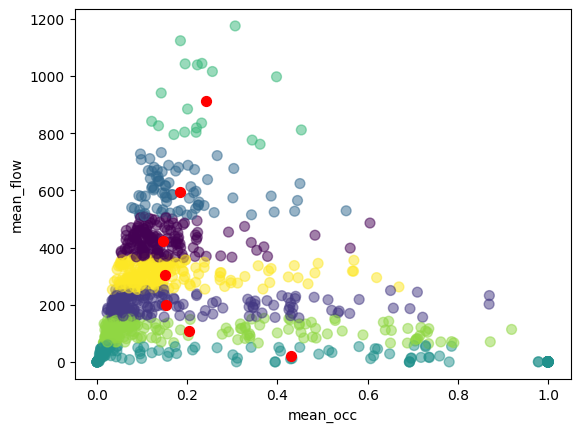

In [13]:
X = mean_detectors[['mean_occ', 'mean_flow']]  # X must be 2D (features only)
kmeans = KMeans(n_clusters=7, random_state=0)  # you can use any number for random_state
kmeans.fit(X)

centroids = kmeans.cluster_centers_

plt.scatter(mean_detectors['mean_occ'], mean_detectors['mean_flow'], c= kmeans.labels_.astype(float), s=50, alpha=0.5)
plt.scatter(centroids[:, 0], centroids[:, 1], c='red', s=50)
plt.xlabel("mean_occ")
plt.ylabel("mean_flow")
plt.show()

The following cell creates the elbow plot. 
Task#7: For what is this graph used.
 Task#8: which other method could be used for that.

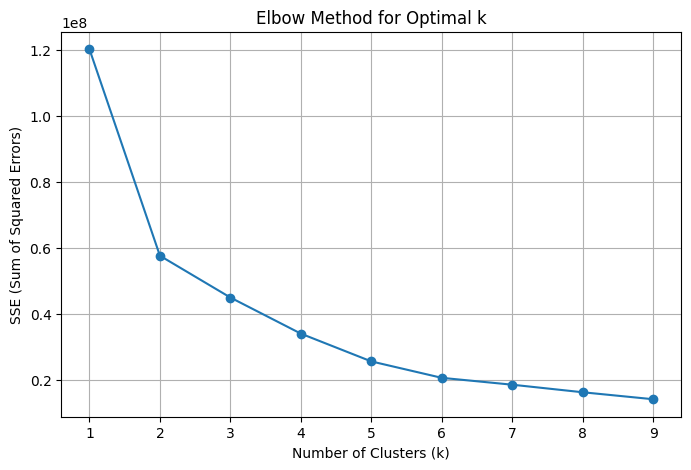

" Another method that can be used to find the optimal number of clusters is the Silhouette Score.\n It measures how similar an object is to its own cluster compared to other clusters.\nThe score ranges from -1 to 1, where a higher score indicates better-defined clusters.\n It is especially helpful when the elbow plot does not show a clear 'elbow\n 1 → perfect fit\n\n0 → overlapping clusters\n\n-1 → wrong cluster"

In [14]:
sse = {}
for k in range(1, 10):
    kmeans = KMeans(n_clusters=k).fit(mean_detectors)
    clusters = kmeans.labels_
    sse[k] = kmeans.inertia_
plt.figure(figsize=(8, 5))
plt.plot(list(sse.keys()), list(sse.values()), marker='o')
plt.xlabel("Number of Clusters (k)")
plt.ylabel("SSE (Sum of Squared Errors)")
plt.title("Elbow Method for Optimal k")
plt.grid(True)
plt.show()

# Task 7:
'''The elbow plot is used to find the optimal number of clusters (k) in the KMeans algorithm.
 It shows how the Sum of Squared Errors (SSE) changes as the number of clusters increases.
Initially, adding clusters significantly reduces SSE, but after a certain point,
the improvement becomes minimal. This point is called the 'elbow' and indicates a good balance between cluster quality and simplicity.'''


#Task 8
''' Another method that can be used to find the optimal number of clusters is the Silhouette Score.
 It measures how similar an object is to its own cluster compared to other clusters.
The score ranges from -1 to 1, where a higher score indicates better-defined clusters.
 It is especially helpful when the elbow plot does not show a clear 'elbow
 1 → perfect fit

0 → overlapping clusters

-1 → wrong cluster'''

The following cells create a dataset which contains the data of the defective detecotr as output and the data of the 5 closest detectors as input. With that data it is later possible to train a model that predicts the occ detector values of the defective detector.

In [15]:
data_london = data
data_london_defect = data_london[data['detid']=='CNTR_N03/164a1']
data_london_defect.reset_index(inplace = False) 

,index,Unnamed: 0,day,interval,detid,flow,occ,error,city,speed
0,10936698,10936698,2015-05-16,0,CNTR_N03/164a1,528.0,0.111667,0.0,london,NaN
1,10936699,10936699,2015-05-16,300,CNTR_N03/164a1,552.0,0.126667,0.0,london,NaN
2,10936700,10936700,2015-05-16,600,CNTR_N03/164a1,672.0,0.147500,0.0,london,NaN
3,10936701,10936701,2015-05-16,900,CNTR_N03/164a1,516.0,0.122500,0.0,london,NaN
4,10936702,10936702,2015-05-16,1200,CNTR_N03/164a1,504.0,0.110000,0.0,london,NaN
...,...,...,...,...,...,...,...,...,...,...
6435,10943133,10943133,2016-05-22,84900,CNTR_N03/164a1,324.0,0.074167,0.0,london,NaN
6436,10943134,10943134,2016-05-22,85200,CNTR_N03/164a1,216.0,0.035000,0.0,london,NaN
6437,10943135,10943135,2016-05-22,85500,CNTR_N03/164a1,144.0,0.031667,0.0,london,NaN
6438,10943136,10943136,2016-05-22,85800,CNTR_N03/164a1,300.0,0.075833,0.0,london,NaN


In [16]:
dataset = data_london[data_london.detid.isin(detector_list)].reset_index(inplace = False)
dataset



,index,Unnamed: 0,day,interval,detid,flow,occ,error,city,speed
0,2220254,2220254,2015-05-16,0,CNTR_N03/032c1,564.0,0.358333,0.0,london,NaN
1,2220255,2220255,2015-05-16,300,CNTR_N03/032c1,384.0,0.306667,0.0,london,NaN
2,2220256,2220256,2015-05-16,600,CNTR_N03/032c1,456.0,0.285833,0.0,london,NaN
3,2220257,2220257,2015-05-16,900,CNTR_N03/032c1,456.0,0.294167,0.0,london,NaN
4,2220258,2220258,2015-05-16,1200,CNTR_N03/032c1,408.0,0.392500,0.0,london,NaN
...,...,...,...,...,...,...,...,...,...,...
29646,23113772,23113772,2016-05-22,84900,NORT_N02/191b1,0.0,0.000000,1.0,london,NaN
29647,23113773,23113773,2016-05-22,85200,NORT_N02/191b1,0.0,0.000000,1.0,london,NaN
29648,23113774,23113774,2016-05-22,85500,NORT_N02/191b1,0.0,0.000000,1.0,london,NaN
29649,23113775,23113775,2016-05-22,85800,NORT_N02/191b1,0.0,0.000000,1.0,london,NaN


In [17]:
input_ = list()
output_ = list()
from statistics import mean
for index, row in data_london_defect.iterrows():
    input_item =list()
    for det_index, detector in enumerate(detector_list):
        current_filter = dataset[(dataset["day"]==row['day'])
                                 & (dataset["interval"] == row['interval'])
                                & (dataset["detid"] == detector)]
        #print(current_filter['flow'].tolist())
        if len(current_filter) == 1:
            input_item.append(current_filter['occ'].tolist()[0])
        else:
            input_item.append(0)
    #output_.append(row['occ'])
    output_.append(mean(input_item))
    input_.append(input_item)

In [18]:
#for i in range(10):
    #print(f'Input: {input_[i]} ; Output:{output_[i]}')
import numpy as np
s = pd.Series(input_)
df = pd.DataFrame(np.vstack(s), columns=['one', 'two', 'three', 'four', 'five'])
s_result = pd.Series(output_)
df_out = pd.DataFrame(np.vstack(s_result), columns=['result'])
print(df)
print(df_out)

           one       two     three  four      five
0     0.145833  0.221667  0.151667   0.0  0.358333
1     0.093333  0.334167  0.130000   0.0  0.306667
2     0.130833  0.175000  0.175000   0.0  0.285833
3     0.120833  0.250000  0.190833   0.0  0.294167
4     0.056667  0.225000  0.148333   0.0  0.392500
...        ...       ...       ...   ...       ...
6435  0.062500  0.276667  0.090833   0.0  0.060000
6436  0.065833  0.491667  0.376667   0.0  0.078333
6437  0.067500  0.502500  0.472500   0.0  0.068333
6438  0.039167  0.415000  0.420833   0.0  0.048333
6439  0.038333  0.077500  0.064167   0.0  0.054167

[6440 rows x 5 columns]
        result
0     0.175500
1     0.172833
2     0.153333
3     0.171167
4     0.164500
...        ...
6435  0.098000
6436  0.202500
6437  0.222167
6438  0.184667
6439  0.046833

[6440 rows x 1 columns]


In [19]:
import plotly.express as px
fig = px.scatter(x=df.index, y=[df.two, df_out.result, df.three, df.one, df.five])
fig.show()


In [20]:
#import pickle
#with open("input", "wb") as fp:   #Pickling
#    pickle.dump(input_, fp)

#with open("output", "wb") as fp:   #Pickling
#    pickle.dump(output_, fp)    

In [21]:
import pickle
with open("input", "rb") as fp:   # Unpickling
    input_ = pickle.load(fp)
    
with open("output", "rb") as fp:   # Unpickling
    output_ = pickle.load(fp)

In [22]:
print(len(input_))

6440


In [23]:
import torch
output__ = torch.tensor(output_)
output__.size()

torch.Size([6440])

In [24]:
import torch
import numpy as np
from torch.utils.data import TensorDataset, DataLoader
input__ = torch.tensor([[item[1], item[2], item[3], item[4], item[0]] for item in input_])
input__.size()

torch.Size([6440, 5])

In [25]:
my_dataset = TensorDataset(input__,output__)

In [26]:
trainloader = DataLoader(my_dataset, batch_size=64, shuffle= True)

In [27]:
dataiter = iter(trainloader)
for i in range(10):
    images, labels = next(dataiter)
    print(images, labels)

tensor([[0.1875, 0.1604, 0.0000, 0.8906, 0.0573],
        [0.2629, 0.0964, 0.0000, 0.8491, 0.1201],
        [0.3900, 0.1500, 0.0000, 0.6650, 0.0533],
        [0.0342, 0.0717, 0.0000, 0.0092, 0.0542],
        [0.2008, 0.1025, 0.0000, 0.4783, 0.0850],
        [0.5117, 0.3125, 0.0000, 0.8142, 0.1192],
        [0.0771, 0.1177, 0.0000, 0.0510, 0.0594],
        [0.3410, 0.1951, 0.0000, 0.0590, 0.0562],
        [0.0692, 0.0367, 0.0000, 0.0233, 0.0442],
        [0.4675, 0.4342, 0.0000, 0.0217, 0.0325],
        [0.1800, 0.1375, 0.0000, 0.6950, 0.1233],
        [0.5281, 0.2687, 0.0000, 0.7677, 0.1292],
        [0.4033, 0.2583, 0.0000, 0.0333, 0.1017],
        [0.2025, 0.1425, 0.0000, 0.7017, 0.1150],
        [0.0718, 0.0829, 0.0000, 0.0634, 0.0879],
        [0.3250, 0.1858, 0.0000, 0.0150, 0.0475],
        [0.3333, 0.1656, 0.0000, 0.1052, 0.0750],
        [0.1325, 0.0800, 0.0000, 0.2558, 0.1117],
        [0.3067, 0.3025, 0.0000, 0.2050, 0.1333],
        [0.0442, 0.0425, 0.0000, 0.0292, 0.0408],


In [28]:
from torch import nn
from torch import optim
import torch.nn.functional as F

Task#9: Create a neural network which learns the relation of the defective detector with the surrounding detectors. The net should be displayed like an image.
Task#10 Also the forward pass is to be created, use ReLu activation function. ![nn%20%281%29.svg](attachment:nn%20%281%29.svg)

In [29]:
#Task 9 and Task 10
class Network(nn.Module):
    def __init__(self):
        super().__init__()
        self.fc1 = nn.Linear(5, 32)   # 5 input neurons, 16 hidden neurons
        self.fc2 = nn.Linear(32, 16)   # second hidden layer
        self.fc3 = nn.Linear(16, 16)    # Third hidden layer
        self.fc6 = nn.Linear(16, 1)    # output layer (1 prediction)

        
    def forward(self, x):
        ''' Forward pass through the network, returns the output logits '''
        x = F.relu(self.fc1(x))      # ReLU activation
        x = F.relu(self.fc2(x))
        x = F.relu(self.fc3(x))
        x = self.fc6(x)              # Output layer without activation (regression)
        return x

model = Network()
model

Network(
  (fc1): Linear(in_features=5, out_features=32, bias=True)
  (fc2): Linear(in_features=32, out_features=16, bias=True)
  (fc3): Linear(in_features=16, out_features=16, bias=True)
  (fc6): Linear(in_features=16, out_features=1, bias=True)
)

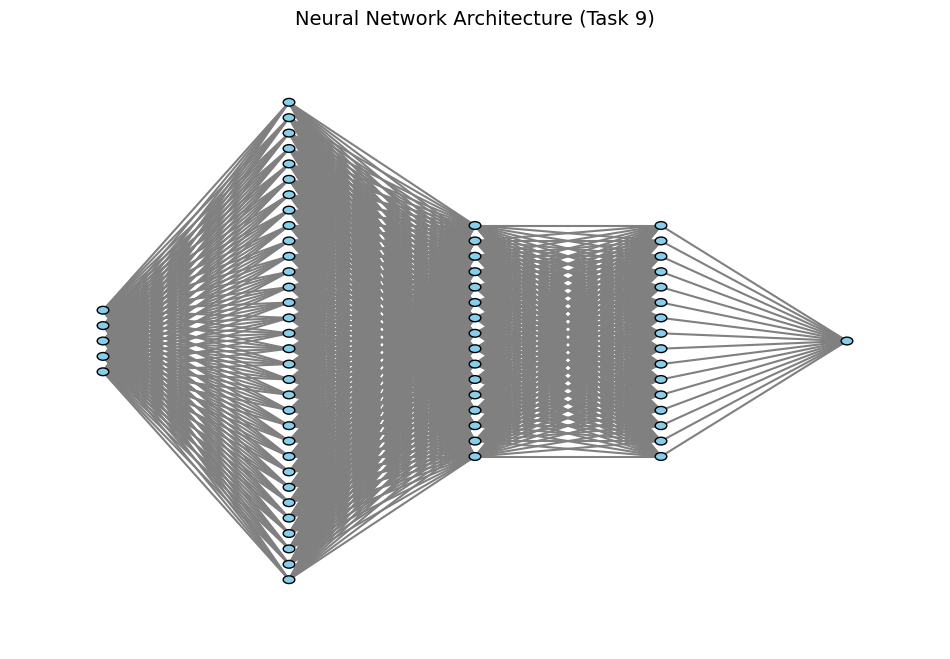

In [30]:
import matplotlib.pyplot as plt

def draw_neural_net(ax, left, right, bottom, top, layer_sizes):
    '''
    Draws a simple bubble-style neural network using matplotlib.
    - layer_sizes: List with number of neurons per layer.
    '''
    v_spacing = (top - bottom) / float(max(layer_sizes))
    h_spacing = (right - left) / float(len(layer_sizes) - 1)

    # Draw nodes
    for i, layer_size in enumerate(layer_sizes):
        layer_top = v_spacing * (layer_size - 1) / 2. + (top + bottom) / 2.
        for j in range(layer_size):
            circle = plt.Circle((left + i * h_spacing, layer_top - j * v_spacing), v_spacing / 4.,
                                color='skyblue', ec='black', zorder=4)
            ax.add_artist(circle)

    # Draw connections
    for i, (layer_size_a, layer_size_b) in enumerate(zip(layer_sizes[:-1], layer_sizes[1:])):
        layer_a_top = v_spacing * (layer_size_a - 1) / 2. + (top + bottom) / 2.
        layer_b_top = v_spacing * (layer_size_b - 1) / 2. + (top + bottom) / 2.
        for j in range(layer_size_a):
            for k in range(layer_size_b):
                line = plt.Line2D([left + i * h_spacing, left + (i + 1) * h_spacing],
                                  [layer_a_top - j * v_spacing, layer_b_top - k * v_spacing], c='gray')
                ax.add_artist(line)

# Define network structure from your model: [5, 32, 16, 16, 1]
layer_sizes = [5, 32, 16, 16, 1]

# Plot setup
fig = plt.figure(figsize=(12, 8))
ax = fig.gca()
ax.axis('off')
draw_neural_net(ax, .1, .9, .1, .9, layer_sizes)
plt.title("Neural Network Architecture (Task 9)", fontsize=14)
plt.show()

In [31]:
# Define optimizer and learning rate
optimizer = optim.Adam(model.parameters(), lr=0.00001)

Task#11: Define a suitable loss function for the existing regression problem.

In [32]:
import torch.nn as nn
criterion = nn.MSELoss()

Task#12: Create the training loop to train the neural network. The training should run 100 epochs.
Task#13: Sum the occuring loss within the episode and save it in a list with the name loss_list.

In [33]:
epochs = 100
steps = 0
loss_list = []
for e in range(epochs):
    loss_item = 0
    for images, labels in trainloader:
        optimizer.zero_grad()
        
        output = model(images).squeeze()  # remove extra dimensions if needed
        labels = labels.squeeze()
        
        loss = criterion(output, labels)
        loss.backward()
        optimizer.step()
        
        loss_item += loss.item()
    
    print(f"Epoch: {e+1}/{epochs}, Loss: {loss_item:.4f}")
    loss_list.append(loss_item)


Epoch: 1/100, Loss: 9.6183
Epoch: 2/100, Loss: 9.2500
Epoch: 3/100, Loss: 8.8839
Epoch: 4/100, Loss: 8.5308
Epoch: 5/100, Loss: 8.2027
Epoch: 6/100, Loss: 7.8827
Epoch: 7/100, Loss: 7.5692
Epoch: 8/100, Loss: 7.2745
Epoch: 9/100, Loss: 6.9882
Epoch: 10/100, Loss: 6.6983
Epoch: 11/100, Loss: 6.4075
Epoch: 12/100, Loss: 6.1298
Epoch: 13/100, Loss: 5.8590
Epoch: 14/100, Loss: 5.5960
Epoch: 15/100, Loss: 5.3404
Epoch: 16/100, Loss: 5.0918
Epoch: 17/100, Loss: 4.8496
Epoch: 18/100, Loss: 4.6186
Epoch: 19/100, Loss: 4.3944
Epoch: 20/100, Loss: 4.1727
Epoch: 21/100, Loss: 3.9603
Epoch: 22/100, Loss: 3.7522
Epoch: 23/100, Loss: 3.5501
Epoch: 24/100, Loss: 3.3594
Epoch: 25/100, Loss: 3.1676
Epoch: 26/100, Loss: 2.9913
Epoch: 27/100, Loss: 2.8234
Epoch: 28/100, Loss: 2.6562
Epoch: 29/100, Loss: 2.4977
Epoch: 30/100, Loss: 2.3498
Epoch: 31/100, Loss: 2.2115
Epoch: 32/100, Loss: 2.0810
Epoch: 33/100, Loss: 1.9634
Epoch: 34/100, Loss: 1.8479
Epoch: 35/100, Loss: 1.7416
Epoch: 36/100, Loss: 1.6406
E

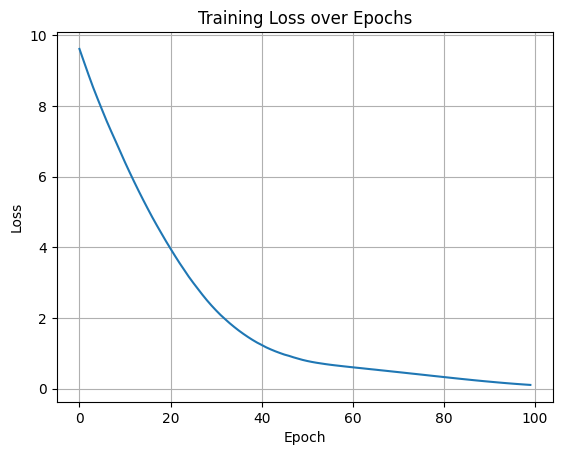

In [34]:
import matplotlib.pyplot as plt

# No need to convert floats anymore
plt.plot(loss_list)
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Loss over Epochs')
plt.grid(True)
plt.show()

